In [207]:
import pandas as pd

%load_ext autoreload
%autoreload 2

# Extra options
pd.options.display.max_rows = 30
pd.options.display.max_columns = 25

# Show all code cells outputs
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'
%matplotlib agg

import logging
logging.basicConfig(level=logging.INFO)

import os
import osmnx as ox
import sys
import importlib
import numpy as np
import matplotlib.pyplot as plt
from shapely import wkt 
import geopandas as gpd
sys.path.insert(0, os.path.abspath('../../'))

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [34]:
from osmnx_network_extract.network_code import return_crs
from osmnx_network_extract.network_code import NetworkCode

In [35]:
test_location = [1.3707707, 103.7511237] # lat-lon in Singapore (Jurong) 

/Users/ejwillemse/opt/anaconda3/envs/waste_labs_examples/lib/python3.8/site-packages/osmnx/plot.py:286: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()


204

91

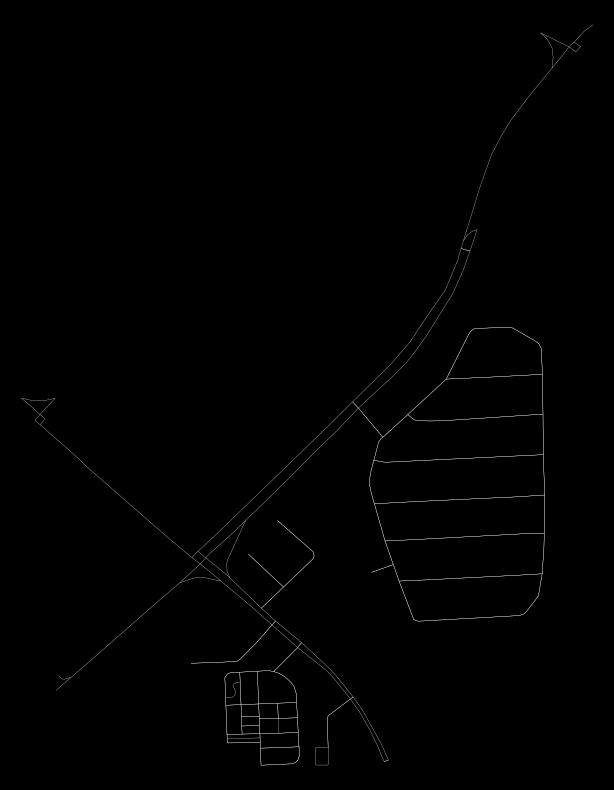

In [36]:
drive_service_all = '["area"!~"yes"]["highway"!~"cycleway|footway|path|pedestrian|steps|track|corridor|elevator|escalator|proposed|construction|bridleway|abandoned|platform|raceway"]["motor_vehicle"!~"no"]["motorcar"!~"no"]'
exclude_emergency_services = '["service"!~"emergency_access"]'
exclude_custom_services = '["access"!~"private"]["service"!~"parking|parking_aisle|private|emergency_access"]'
exclude_parking_privarte_emergency = '["access"!~"private"]["service"!~"parking|private|emergency_access"]'
exclude_private = '["access"!~"private"]["service"!~"private"]'
custom_filter = drive_service_all + exclude_emergency_services

G = ox.graph_from_point(center_point=test_location, dist_type='network', dist=800, custom_filter=custom_filter)
fig, ax = ox.plot_graph(G, node_size=0, edge_color='w', edge_linewidth=0.2, bgcolor='k', fig_height=10)
G.number_of_edges()
G.number_of_nodes()
fig

In [37]:
gdf_graph = ox.graph_to_gdfs(G)
gdf_nodes = gdf_graph[0]
gdf_arcs = gdf_graph[1].copy() # a bi-directional graph is returned, so the network has arcs, not edges.

In [38]:
gdf_nodes['lat'] = gdf_nodes['x'] + np.random.uniform(low=-0.01, high=0.01, size=gdf_nodes.shape[0])
gdf_nodes['lon'] = gdf_nodes['y'] + np.random.uniform(low=-0.01, high=0.01, size=gdf_nodes.shape[0])

In [39]:
gdf_nodes.to_csv('test/customer_points.csv', index=False)

In [40]:
prep_network = pd.read_csv('test/cit_punggol_internal_50m_buffer_contain.csv')

In [41]:
prep_network

,u,v,key,osmid,lanes,highway,service,oneway,length,geometry,name,maxspeed,...,ref,access,junction,width,arc_id,arc_id_orig,u_orig,v_orig,arc_id_ordered,arc_id_ordered_orig,parallel,Name
0,4604559376,4488368046,0,"[753159712, 639706205, 753159711]",4,tertiary,NaN,False,59.830,"LINESTRING (103.8777916 1.3228068, 103.877663 ...",Kallang Way,50,...,NaN,NaN,NaN,NaN,4604559376-4488368046,4604559376-4488368046-0,4.604559e+09,4.488368e+09,4488368046-4604559376,4488368046-4604559376,False,Sub-sector A - City
1,4604559376,5683821101,0,"[666595169, 666595170, 644399321]",2,residential,NaN,False,51.201,"LINESTRING (103.8777916 1.3228068, 103.8777027...",Kallang Way 2A,50,...,NaN,NaN,NaN,NaN,4604559376-5683821101,4604559376-5683821101-0,4.604559e+09,5.683821e+09,4604559376-5683821101,4604559376-5683821101,False,Sub-sector A - City
2,4604559376,4488368055,0,"[764039529, 764039530, 639711921]",4,tertiary,NaN,False,20.401,"LINESTRING (103.8777916 1.3228068, 103.8778413...",Kallang Way,50,...,NaN,NaN,NaN,NaN,4604559376-4488368055,4604559376-4488368055-0,4.604559e+09,4.488368e+09,4488368055-4604559376,4488368055-4604559376,False,Sub-sector A - City
3,385613932,366653047,0,"[383372420, 693663613]",3,motorway,NaN,True,1391.466,"LINESTRING (103.8766693 1.2973415, 103.8767555...",Kallang-Paya Lebar Expressway,80,...,KPE,NaN,NaN,NaN,385613932-366653047,385613932-366653047-0,3.856139e+08,3.666530e+08,385613932-366653047,385613932-366653047-0,False,Sub-sector A - City
4,4604821646,243230385,0,637455171,3,tertiary,NaN,False,35.944,"LINESTRING (103.8991205 1.3264995, 103.8988063...",Ubi Avenue 1,50,...,NaN,NaN,NaN,NaN,4604821646-243230385,4604821646-243230385-0,4.604822e+09,2.432304e+08,243230385-4604821646,243230385-4604821646,False,Sub-sector A - City
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26358,77307331507,773073539227,1,543735156,1,service,NaN,True,45.029,"LINESTRING (103.9026901 1.385734, 103.9026142 ...",NaN,NaN,...,NaN,NaN,NaN,NaN,77307331507-773073539227,5256240692-5256240685-1,5.256241e+09,5.256241e+09,77307331507-773073539227,5256240692-5256240685-1,True,Sub-sector B - Punggol
26359,77307331877,773073539597,1,"[735217973, 543352142]",1,service,parking_aisle,True,92.503,"LINESTRING (103.8930374 1.3724717, 103.89303 1...",NaN,NaN,...,NaN,NaN,NaN,NaN,77307331877-773073539597,5252571177-5252571170-1,5.252571e+09,5.252571e+09,77307331877-773073539597,5252571177-5252571170-1,True,Sub-sector B - Punggol
26360,77307332361,773073540081,0,"[643446253, 599126893, 599126895]",1,service,NaN,True,216.760,"LINESTRING (103.886293 1.3441932, 103.8863292 ...",NaN,NaN,...,NaN,NaN,NaN,NaN,77307332361-773073540081,5701100079-5701100097-0,5.701100e+09,5.701100e+09,77307332361-773073540081,5701100079-5701100097-0,True,Sub-sector B - Punggol
26361,77307332362,773073540082,1,759531828,1,service,NaN,True,36.106,"LINESTRING (103.886293 1.3441932, 103.8863419 ...",NaN,NaN,...,NaN,NaN,NaN,NaN,77307332362-773073540082,5701100079-5701100097-1,5.701100e+09,5.701100e+09,77307332362-773073540082,5701100079-5701100097-1,True,Sub-sector B - Punggol


In [42]:
prep_network['geometery'] = prep_network['geometry'].apply(wkt.loads)


In [43]:
prep_network['geometery'] = prep_network['geometery'].astype(str)

In [44]:
prep_network['geometery'].apply(wkt.loads)

0        LINESTRING (103.8777916 1.3228068, 103.877663 ...
1        LINESTRING (103.8777916 1.3228068, 103.8777027...
2        LINESTRING (103.8777916 1.3228068, 103.8778413...
3        LINESTRING (103.8766693 1.2973415, 103.8767555...
4        LINESTRING (103.8991205 1.3264995, 103.8988063...
                               ...                        
26358    LINESTRING (103.9026901 1.385734, 103.9026142 ...
26359    LINESTRING (103.8930374 1.3724717, 103.89303 1...
26360    LINESTRING (103.886293 1.3441932, 103.8863292 ...
26361    LINESTRING (103.886293 1.3441932, 103.8863419 ...
26362    LINESTRING (103.8888286 1.3974676, 103.8888319...
Name: geometery, Length: 26363, dtype: object

In [182]:
from osmnx_network_extract.network_code import return_crs
from osmnx_network_extract.network_code import NetworkCode
from osmnx_network_extract.network_code import create_gdf
from osmnx_network_extract.network_code import customer_network_plot

In [183]:
prep_network['geometry'].dtype

In [184]:
prep_network['points'] = prep_network.apply(lambda x: [y for y in x['geometry'].coords], axis=1)

In [49]:
prep_network['points']

0        [(103.8777916, 1.3228068), (103.877663, 1.3227...
1        [(103.8777916, 1.3228068), (103.8777027, 1.323...
2        [(103.8777916, 1.3228068), (103.8778413, 1.322...
3        [(103.8766693, 1.2973415), (103.8767555, 1.297...
4        [(103.8991205, 1.3264995), (103.8988063, 1.326...
                               ...                        
26358    [(103.9026901, 1.385734), (103.9026142, 1.3857...
26359    [(103.8930374, 1.3724717), (103.89303, 1.37281...
26360    [(103.886293, 1.3441932), (103.8863292, 1.3441...
26361    [(103.886293, 1.3441932), (103.8863419, 1.3442...
26362    [(103.8888286, 1.3974676), (103.8888319, 1.397...
Name: points, Length: 26363, dtype: object

In [50]:
prep_network['u_lat'] = prep_network['points'].apply(lambda x: x[0][1])
prep_network['u_lon'] = prep_network['points'].apply(lambda x: x[0][0])
prep_network['v_lat'] = prep_network['points'].apply(lambda x: x[-1][1])
prep_network['v_lon'] = prep_network['points'].apply(lambda x: x[-1][0])

In [51]:
prep_network_u = prep_network[['u', 'u_lon', 'u_lat']]
prep_network_u.columns = ['u',  'x', 'y']
prep_network_v = prep_network[['v', 'v_lon', 'v_lat']]
prep_network_v.columns = ['u', 'x', 'y']

In [52]:
prep_network_nodes = pd.concat([prep_network_u, prep_network_v])

In [53]:
prep_network_nodes = prep_network_nodes.drop_duplicates()

In [54]:
prep_network_nodes = prep_network_nodes.set_index(['u'], drop=False, )

In [55]:
from osmnx_network_extract.network_code import extract_node_gdf

In [156]:
df_node_test = extract_node_gdf(gdf_arcs, crs='EPSG:3414')
df_node_test = 

In [57]:
df_node_test_two = df_node_test.merge(gdf_nodes, how='left', left_index=True, right_index=True)

In [58]:
(df_node_test_two['x_x'] == df_node_test_two['x_y']).all()
(df_node_test_two['y_x'] == df_node_test_two['y_y']).all()

True

True

## Full network test

In [59]:
geocode_network = NetworkCode(prep_network, 'SG', xy_converted=False)

In [60]:
gdf_customers = geocode_network.create_nodes_gdf(geocode_network.df_network)

In [61]:
gdf_customers['lat'] = gdf_customers['y']  + np.random.uniform(low=-0.001, high=0.001, size=gdf_customers.shape[0])
gdf_customers['lon'] = gdf_customers['x']  + np.random.uniform(low=-0.001, high=0.001, size=gdf_customers.shape[0])

In [62]:
from osmnx_network_extract.network_code import create_latlon_gdf

In [63]:
gdf_customers = create_latlon_gdf(gdf_customers, 'EPSG:4326')

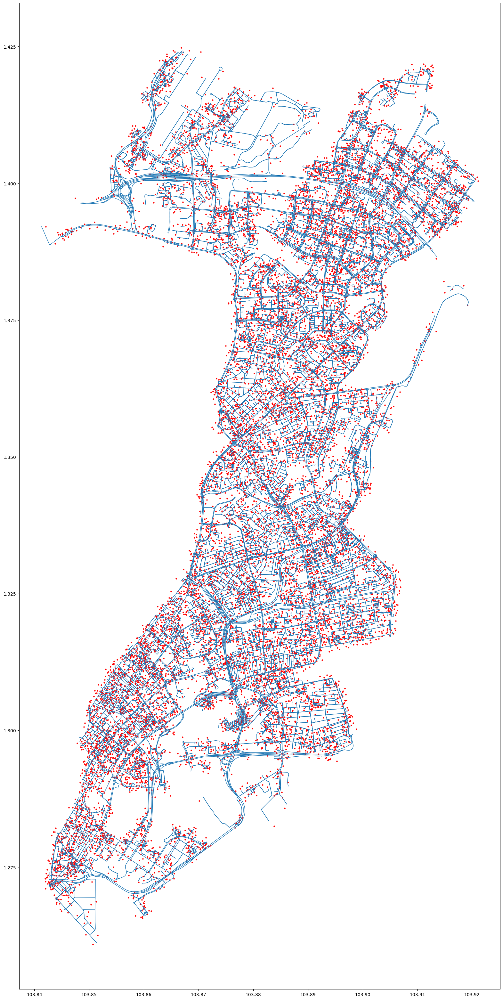

In [65]:
fig, ax = plt.subplots(figsize = (40, 40)) 
_ = gdf_customers.plot(ax=ax, markersize=5, facecolor='red')
_ = geocode_network.df_network.plot(ax=ax, linewidth=1)
fig

In [67]:
geocode_network2 = NetworkCode(prep_network, 'SG')
geocode_network2.convert_direct()

In [68]:
geocode_network2.add_customers(gdf_customers)
gdf_customers = geocode_network2.df.copy()

In [69]:
prep_network['arc_id_ordered'].isin(geocode_network2.df_network['arc_id_ordered']).all()

True

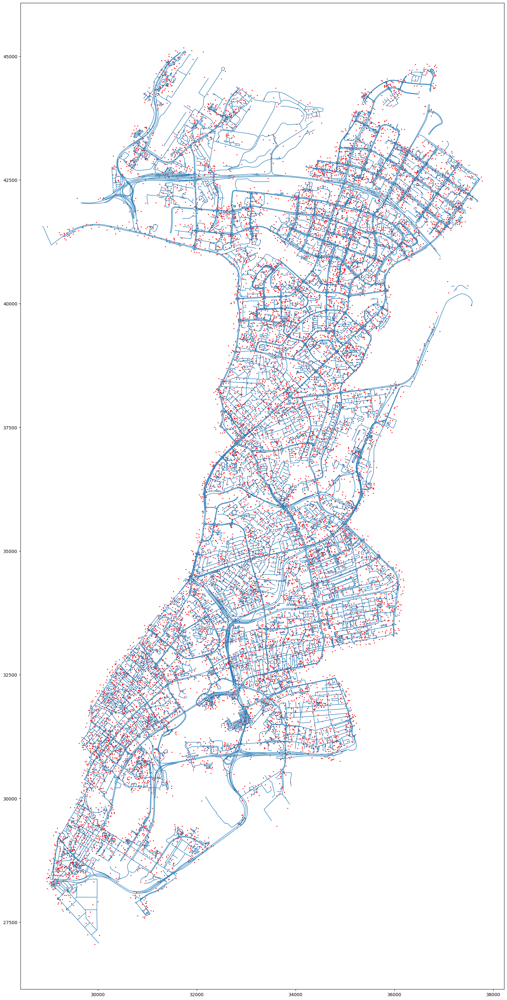

In [70]:
fig, ax = plt.subplots(figsize = (40, 40)) 
_ = geocode_network2.df.plot(ax=ax, markersize=1.5, facecolor='red')
_ = geocode_network2.df_network.plot(ax=ax, linewidth=1)
fig

In [72]:
geocode_network2.filter_network(['residential'])

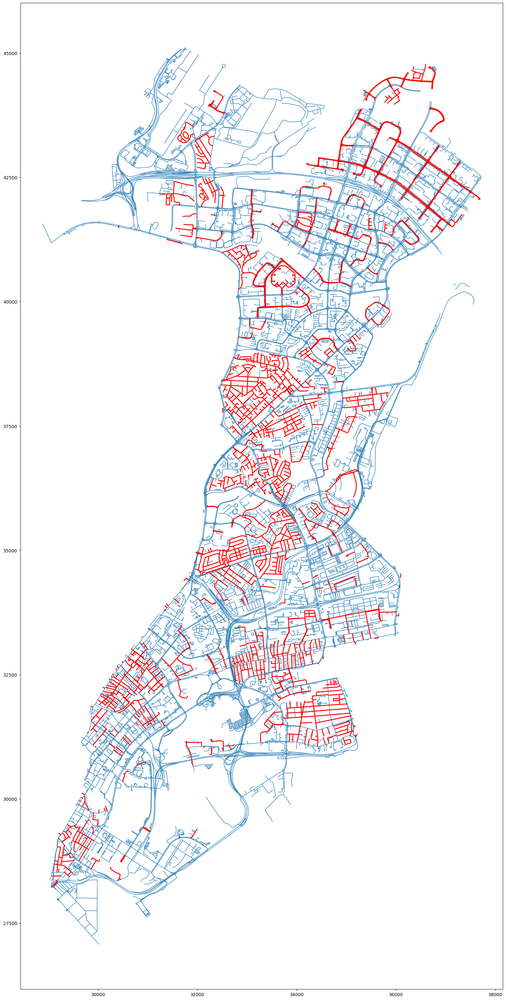

In [76]:
fig, ax = plt.subplots(figsize = (40, 40)) 
_ = geocode_network2.df_network.plot(ax=ax, linewidth=1)
_ = geocode_network2.df_network_filter.plot(ax=ax, linewidth=2, color='red')
fig

In [77]:
geocode_network2.add_customers(gdf_customers.iloc[:1000], gdf_convert=False)

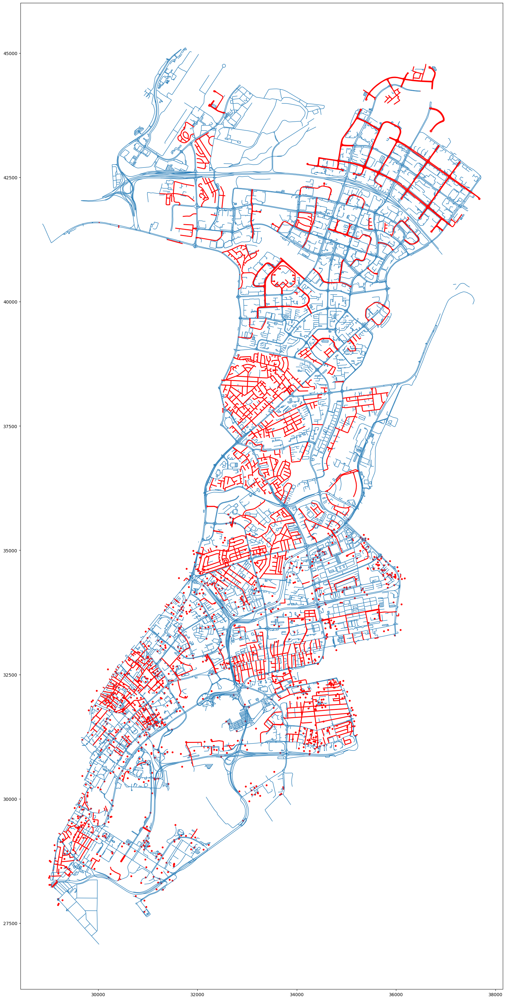

In [79]:
fig, ax = plt.subplots(figsize = (40, 40)) 
_ = geocode_network2.df.plot(ax=ax, markersize=10, facecolor='red')
_ = geocode_network2.df_network.plot(ax=ax, linewidth=1)
_ = geocode_network2.df_network_filter.plot(ax=ax, linewidth=2, color='red')
fig

In [80]:
geocode_network2 = NetworkCode(prep_network, 'SG', xy_converted=True)
geocode_network2.convert_direct()
geocode_network2.add_customers(gdf_customers, gdf_convert=False)

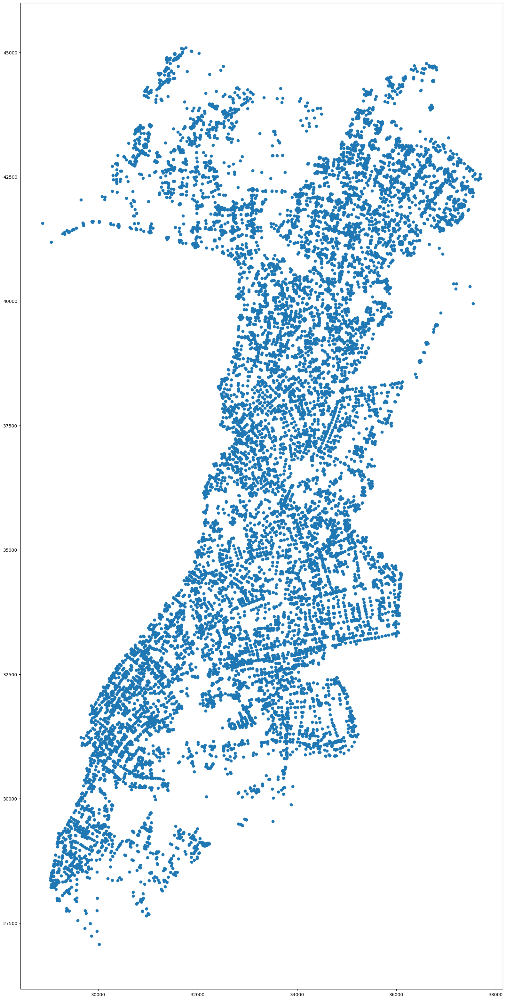

In [93]:
fig, ax = plt.subplots(figsize = (40, 40)) 
_ = geocode_network2.df_nodes_filter.plot(ax=ax)
fig

In [110]:
%%time
df_customer_fit = geocode_network2.snapping_points(dist=30)

4604559376    32949.404001
385613932     32824.551865
4604821646    35323.088045
4604821647    35256.959988
4604821651    35280.830528
                  ...     
243670976     33217.970412
1366319995    34621.820306
1366320006    34631.750528
1366320001    34870.210502
1366319985    34525.611067
Length: 1042, dtype: float64
CPU times: user 993 ms, sys: 14.5 ms, total: 1.01 s
Wall time: 1.01 s


In [111]:
df_customer_fit = df_customer_fit.set_geometry('geometry_u', crs='EPSG:4326')
df_customer_fit = df_customer_fit.to_crs('EPSG:3414')

In [112]:
df_customer_fit

,u,x,y,geometry,lat,lon,arc_u,arc_v,arc_id,dist_u,closest_u,geometry_u,lon_u,lat_u,geometry_arc,arc_snap_point,x_arc_snap,y_arc_snap,lon_arc_snap,lat_arc_snap,arc_dist,arc_collect,lon_collect,lat_collect,dist_collect
0,4604559376,32931.636881,33830.576713,POINT (32931.637 33830.577),1.322226,103.877632,4604559376,4488368046,4604559376-4488368046,56.387176,4.488368e+09,POINT (inf inf),103.877293,1.322605,"LINESTRING (32949.404 33894.816, 32935.092 338...",POINT (32911.853 33879.709),32911.852926,33879.708572,103.877454,1.322670,52.965503,True,103.877454,1.322670,52.965503
1,385613932,32806.625425,31172.083940,POINT (32806.625 31172.084),1.298183,103.876508,385613932,366653047,385613932-366653047,94.802651,3.856139e+08,POINT (inf inf),103.876669,1.297341,"LINESTRING (32824.552 31078.992, 32834.145 311...",POINT (32854.396 31153.624),32854.396139,31153.624078,103.876937,1.298016,51.213354,True,103.876937,1.298016,51.213354
2,4604821646,35298.897611,34199.079771,POINT (35298.898 34199.080),1.325558,103.898903,3109302827,3109303229,3109302827-3109303229,43.173939,3.109303e+09,POINT (inf inf),103.899265,1.325698,"LINESTRING (35339.216 34214.520, 35312.151 342...",POINT (35310.060 34210.315),35310.060298,34210.315236,103.899003,1.325660,15.837968,True,103.899003,1.325660,15.837968
3,4604821647,35325.529898,34227.168197,POINT (35325.530 34227.168),1.325812,103.899142,3109302827,1870979650,3109302827-1870979650,18.636064,3.109303e+09,POINT (inf inf),103.899265,1.325698,"LINESTRING (35339.216 34214.520, 35344.559 341...",POINT (35339.216 34214.520),35339.216317,34214.519687,103.899265,1.325698,18.636064,False,103.899265,1.325698,18.636064
4,4604821651,35198.152409,34423.621827,POINT (35198.152 34423.622),1.327589,103.897998,4604821651,5118428329,4604821651-5118428329,124.296993,4.604822e+09,POINT (inf inf),103.898741,1.326749,"LINESTRING (35280.831 34330.810, 35273.117 343...",POINT (35261.171 34435.470),35261.171060,34435.469907,103.898564,1.327696,64.122753,True,103.898564,1.327696,64.122753
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,4459074493,33044.983820,35332.111850,POINT (33044.984 35332.112),1.335805,103.878651,4459074494,243663917,4459074494-243663917,66.065921,2.436639e+08,POINT (inf inf),103.878075,1.335657,"LINESTRING (32971.147 35310.883, 32980.974 353...",POINT (32980.974 35315.760),32980.973508,35315.759910,103.878075,1.335657,66.065921,False,103.878075,1.335657,66.065921
96,4459074501,35040.542019,35620.691044,POINT (35040.542 35620.691),1.338415,103.896582,4459074501,230851200,4459074501-230851200,92.545577,2.308512e+08,POINT (inf inf),103.896022,1.337796,"LINESTRING (34951.171 35520.930, 34972.271 355...",POINT (34978.180 35552.312),34978.179913,35552.312308,103.896022,1.337796,92.545577,False,103.896022,1.337796,92.545577
97,6528701386,34448.582575,33865.005601,POINT (34448.583 33865.006),1.322537,103.891263,246960848,246961164,246960848-246961164,33.535555,2.469608e+08,POINT (inf inf),103.891091,1.322787,"LINESTRING (34429.529 33892.602, 34448.673 338...",POINT (34436.110 33862.297),34436.110139,33862.296900,103.891150,1.322512,12.763179,True,103.891150,1.322512,12.763179
98,1633162341,29919.005937,29547.653495,POINT (29919.006 29547.653),1.283493,103.850562,248527542,4608814760,248527542-4608814760,121.824944,4.608815e+09,POINT (inf inf),103.849659,1.282869,"LINESTRING (29764.711 29525.932, 29790.308 295...",POINT (29818.577 29478.695),29818.576705,29478.694911,103.849659,1.282869,121.824944,False,103.849659,1.282869,121.824944


In [128]:
fig, ax = plt.subplots(figsize = (40, 40)) 
_ = geocode_network2.df.plot(ax=ax, markersize=5, facecolor='blue')
_ = geocode_network2.df_network_filter.plot(ax=ax, linewidth=1, color='green')
_ = df_customer_fit.plot(ax=ax, markersize=10, facecolor='red')
fig

AttributeError: 'NoneType' object has no attribute 'plot'

In [117]:
from visualise.customer_plots import return_scatter_layer, color_df, return_arc_layer
import pydeck as pdk

In [118]:
with open('../../keys/mapbox_key.txt', 'r') as f:
    mapbox_key = f.readline()

In [119]:
plt_map = df_customer_fit[['lon', 'lat', 'lon_u', 'lat_u', 'dist_u']].copy()

In [120]:
scatter_orig = return_scatter_layer(plt_map, 'original', 'lat', 'lon', [250, 0, 0, 250])
scatter_new = return_scatter_layer(plt_map, 'snapped', 'lat_u', 'lon_u', [250, 250, 0, 250])
arcs = return_arc_layer(plt_map, 'arcs', 'lat', 'lon', 'lat_u', 'lon_u', [250, 0, 0, 250], [250, 250, 0, 250])

In [121]:
viewport = pdk.data_utils.compute_view(points=plt_map[['lon', 'lat']], view_proportion=0.95)

In [122]:
r = pdk.Deck(layers=[scatter_orig, scatter_new, arcs], 
              initial_view_state=viewport, 
              mapbox_key = mapbox_key, 
              height = 1250,
              width = 1250
             )
r.show()

DeckGLWidget(height=1250, json_input='{"initialViewState": {"latitude": 1.3123689182767708, "longitude": 103.8…

## Small examples

In [189]:
geocode_network2 = NetworkCode(prep_network.iloc[:1000], 'SG')
geocode_network2.convert_direct()

In [190]:
temp_customers = gdf_customers.iloc[:100].copy()
temp_customers = temp_customers[['lat', 'lon']]
temp_customers['u_id'] = temp_customers.index
temp_customers = temp_customers.reset_index(drop=True)

In [191]:
geocode_network2.add_customers(temp_customers)

In [198]:
geocode_network2.find_nearest_collection_point()

In [199]:
geocode_network2.convert_geometries_latlon()

In [200]:
df_customer_fit = geocode_network2.df_collection_points

In [202]:
plt_map = df_customer_fit[['lon', 'lat', 'lon_collect', 'lat_collect', 'dist_collect', 'arc_collect']].copy()
scatter_orig = return_scatter_layer(plt_map, 'original', 'lat', 'lon', [250, 0, 0, 250])
scatter_new = return_scatter_layer(plt_map, 'snapped', 'lat_collect', 'lon_collect', [250, 250, 0, 250])
arcs = return_arc_layer(plt_map, 'arcs', 'lat', 'lon', 'lat_collect', 'lon_collect', [250, 0, 0, 250], [250, 250, 0, 250])

In [203]:
viewport = pdk.data_utils.compute_view(points=plt_map[['lon', 'lat']], view_proportion=0.95)

In [204]:
r = pdk.Deck(layers=[scatter_orig, scatter_new, arcs], 
              initial_view_state=viewport, 
              mapbox_key = mapbox_key, 
              height = 1250,
              width = 1250
             )
r.show()

DeckGLWidget(height=1250, json_input='{"initialViewState": {"latitude": 1.3123689182767708, "longitude": 103.8…

## Full examples auto

In [211]:
geocode_network2 = NetworkCode(prep_network, 'SG')
geocode_network2.convert_direct()

temp_customers = gdf_customers.copy()
temp_customers = temp_customers[['lat', 'lon']]
temp_customers['u_id'] = temp_customers.index
temp_customers = temp_customers.reset_index(drop=True)
geocode_network2.add_customers(temp_customers)
geocode_network2.find_nearest_collection_point()

df_customer_fit = geocode_network2.df_collection_points
plt_map = df_customer_fit[['lon', 'lat', 'lon_collect', 'lat_collect', 'dist_collect', 'arc_collect']].copy()
scatter_orig = return_scatter_layer(plt_map, 'original', 'lat', 'lon', [250, 0, 0, 250])
scatter_new = return_scatter_layer(plt_map, 'snapped', 'lat_collect', 'lon_collect', [250, 250, 0, 250])
arcs = return_arc_layer(plt_map, 'arcs', 'lat', 'lon', 'lat_collect', 'lon_collect', [250, 0, 0, 250], [250, 250, 0, 250])

viewport = pdk.data_utils.compute_view(points=plt_map[['lon', 'lat']], view_proportion=0.95)

r = pdk.Deck(layers=[scatter_orig, scatter_new, arcs], 
              initial_view_state=viewport, 
              mapbox_key = mapbox_key, 
              height = 1250,
              width = 1250
             )
r.show()

INFO:root:Convert network to lat-lon
INFO:root:Extracting nodes from network
INFO:root:Removing opposing network arcs (only need one).
INFO:root:Arcs removed: 7938.
INFO:root:Adding 14919 customers.
INFO:root:Find nearest arc
INFO:root:Number of arcs 18425 number of points 14919
INFO:root:Find closest assigned end point
INFO:root:Find closest point on assigned arc
INFO:root:Find best collection point


DeckGLWidget(height=1250, json_input='{"initialViewState": {"latitude": 1.3473870490680833, "longitude": 103.8…

## Full examples residential

In [235]:
geocode_network2 = NetworkCode(prep_network, 'SG')
geocode_network2.convert_direct()

temp_customers = gdf_customers.copy()
temp_customers = temp_customers[['lat', 'lon']]
temp_customers['u_id'] = temp_customers.index
temp_customers = temp_customers.reset_index(drop=True)
geocode_network2.add_customers(temp_customers)
geocode_network2.filter_network(['residential'])
geocode_network2.find_nearest_collection_point()

INFO:root:Convert network to x-y
INFO:root:Extracting nodes from network
INFO:root:Removing opposing network arcs (only need one).
INFO:root:Arcs removed: 7938.
INFO:root:Adding 14919 customers.
INFO:root:Filtering network on: highway
INFO:root:Arcs removed: 14133
INFO:root:Find nearest arc
INFO:root:Number of arcs 4292 number of points 14919
INFO:root:Find closest assigned end point
INFO:root:Find closest point on assigned arc
INFO:root:Find best collection point


In [236]:
df_customer_fit = geocode_network2.df_collection_points
plt_map = df_customer_fit[['lon', 'lat', 'lon_collect', 'lat_collect', 'dist_collect', 'arc_collect']].copy()
scatter_orig = return_scatter_layer(plt_map, 'original', 'lat', 'lon', [250, 0, 0, 250])
scatter_new = return_scatter_layer(plt_map, 'snapped', 'lat_collect', 'lon_collect', [250, 250, 0, 250])
arcs = return_arc_layer(plt_map, 'arcs', 'lat', 'lon', 'lat_collect', 'lon_collect', [250, 0, 0, 250], [250, 250, 0, 250])

viewport = pdk.data_utils.compute_view(points=plt_map[['lon', 'lat']], view_proportion=0.95)

r = pdk.Deck(layers=[scatter_orig, scatter_new, arcs], 
              initial_view_state=viewport, 
              mapbox_key = mapbox_key, 
              height = 1250,
              width = 1250
             )
r.show()

DeckGLWidget(height=1250, json_input='{"initialViewState": {"latitude": 1.3473870490680748, "longitude": 103.8…